## Decision Tree Example

## Objectives

To develop a good understanding of Decesion Tree Classification 
*   Decesion Tree Classifier
*   Decesion Tree Regressor

In Decesion Tree there are two types of algorithms
*   ID3 Algorithm (Iterative Dichotomiser 3)
*   CART Algorithm (Calssification and Regression Tree)

Purity Check 
*   Entropy  
*   Gini Index

Feature selection
*   Information gain

Over coming overfitting with
*   Pre and post pruining

\-Find best Hyperparameter for Decision Tree and Decision Tree Regressor

*  maxdepth

*   Find the method performs best using test data


## Import Libraries and Define Auxiliary Functions

In [14]:
# Pandas is a software library written for the Python programming language for data manipulation and analysis.
import pandas as pd
# NumPy is a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices,
# along with a large collection of high-level mathematical functions to operate on these arrays
import numpy as np
# Matplotlib is a plotting library for python and pyplot gives us a MatLab like plotting framework. We will use this in 
# our plotter function to plot data.
import matplotlib.pyplot as plt
#Pandas profiling is a software library for data profiling
from pandas_profiling import ydata_profiling
from pandas_profiling import ProfileReport
#Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing 
# attractive and informative statistical graphics
import seaborn as sns

# Matplotlib plotter function to plot inline
%matplotlib inline
 
 
# Allows us to test parameters of Decision Tree classification algorithms and find the best one
from sklearn.tree import DecisionTreeClassifier
# Allows us to test parameters of Decision Tree Regressor algorithms and find the best one
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve


## Load the dataframe

Load the data


data = pd.read_csv("......csv")


data.head()

In [7]:
data = pd.read_csv("winequality-red.csv")

# load this csv

data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


# Conduct profiling report to chek the data quality report


data skewness, null value, zero values

In [8]:
set(data.quality)

{3, 4, 5, 6, 7, 8}

In [16]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Data preparation slpiting the raw data in x an Y training and test set


-Label - Quality Column

-Features - will rest of the columns

In [17]:
x = data.drop(columns='quality')
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1591,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1592,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1593,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1594,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [18]:
y = data.quality
y

0       5
1       5
2       5
3       6
4       5
       ..
1591    5
1592    6
1593    6
1594    5
1595    6
Name: quality, Length: 1596, dtype: int64

# Pre-processing:  

We are not handling any data pre-processing.

-Handling missing values

-Standard scaling factors

-Handling zero values

-Handling duplicate values

-imputation of missing values

-Adding derived colums

-Adding any 3rd party data depending on the business case understnading

## Train and Train the split dataset

In [22]:
x_train, x_test, y_train, y_test =train_test_split(x, y, test_size=0.25, random_state=30)

In [23]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

### By Default no depth is selected so an overfitted DecisionTree is created


First we will try to display the decision tree

for that we will import the tree from sklearn

[Text(0.4466009131671041, 0.9736842105263158, 'x[10] <= 9.925\ngini = 0.634\nsamples = 1197\nvalue = [5, 38, 521, 481, 142, 10]'),
 Text(0.2101036198600175, 0.9210526315789473, 'x[6] <= 98.5\ngini = 0.481\nsamples = 518\nvalue = [2, 17, 343, 146, 10, 0]'),
 Text(0.1323682195975503, 0.868421052631579, 'x[9] <= 0.575\ngini = 0.518\nsamples = 443\nvalue = [2, 16, 271, 144, 10, 0]'),
 Text(0.04888451443569554, 0.8157894736842105, 'x[8] <= 3.225\ngini = 0.42\nsamples = 185\nvalue = [1, 12, 136, 35, 1, 0]'),
 Text(0.017497812773403325, 0.7631578947368421, 'x[6] <= 11.0\ngini = 0.213\nsamples = 59\nvalue = [0, 1, 52, 6, 0, 0]'),
 Text(0.01399825021872266, 0.7105263157894737, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2, 0, 0]'),
 Text(0.02099737532808399, 0.7105263157894737, 'x[6] <= 96.5\ngini = 0.163\nsamples = 57\nvalue = [0, 1, 52, 4, 0, 0]'),
 Text(0.017497812773403325, 0.6578947368421053, 'x[10] <= 9.65\ngini = 0.135\nsamples = 56\nvalue = [0, 1, 52, 3, 0, 0]'),
 Text(0.006999125109361

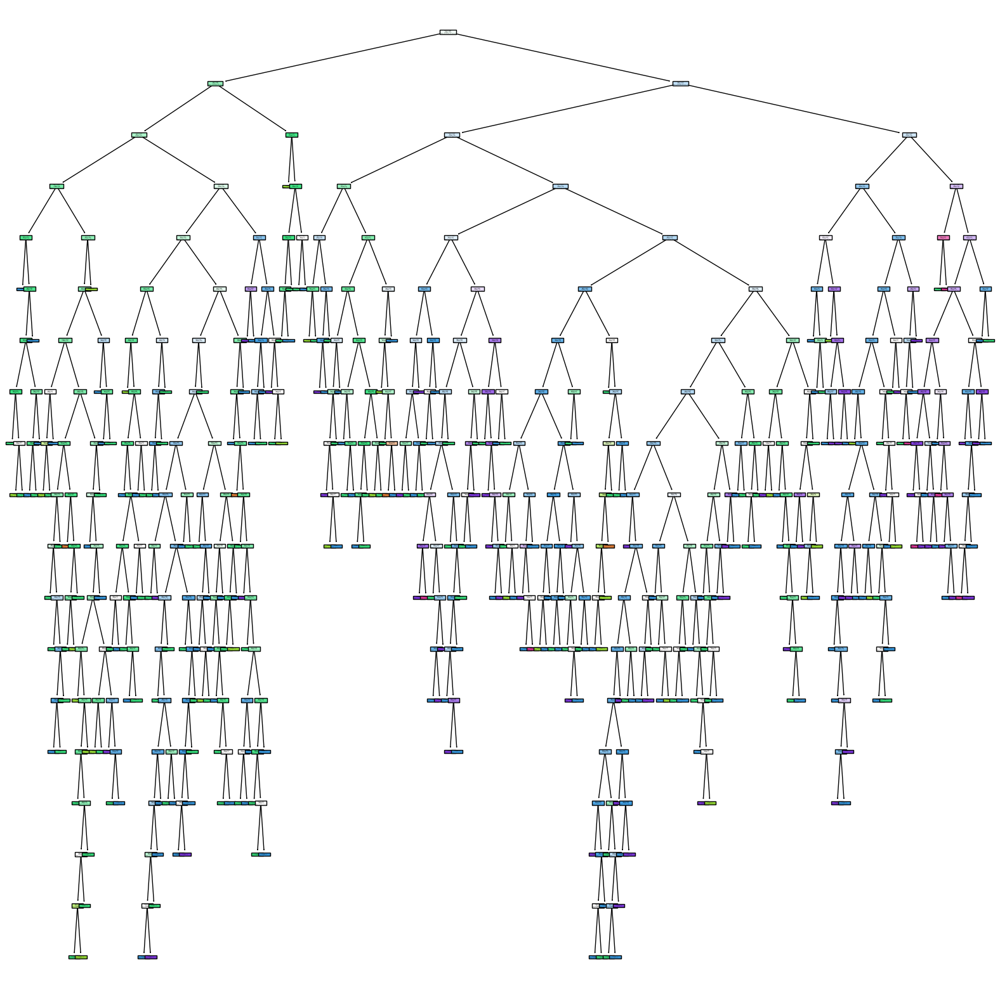

In [25]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled=True)

Create a smaller dataset so that we can view the DT

In [28]:
df1 = data.head(40)


In [29]:
x1 = df1.drop(columns='quality')

In [30]:
y1= df1.quality

In [44]:
set(x1)

{'alcohol',
 'chlorides',
 'citric acid',
 'density',
 'fixed acidity',
 'free sulfur dioxide',
 'pH',
 'residual sugar',
 'sulphates',
 'total sulfur dioxide',
 'volatile acidity'}

[Text(0.6041666666666666, 0.9375, 'sulphates <= 0.42\ngini = 0.546\nsamples = 40\nvalue = [2, 25, 9, 4]\nclass = 5'),
 Text(0.375, 0.8125, 'citric acid <= 3.355\ngini = 0.48\nsamples = 36\nvalue = [2, 25, 6, 3]\nclass = 5'),
 Text(0.16666666666666666, 0.6875, 'volatile acidity <= 0.385\ngini = 0.1\nsamples = 19\nvalue = [0, 18, 0, 1]\nclass = 5'),
 Text(0.08333333333333333, 0.5625, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]\nclass = 7'),
 Text(0.25, 0.5625, 'gini = 0.0\nsamples = 18\nvalue = [0, 18, 0, 0]\nclass = 5'),
 Text(0.5833333333333334, 0.6875, 'citric acid <= 3.465\ngini = 0.678\nsamples = 17\nvalue = [2, 7, 6, 2]\nclass = 5'),
 Text(0.4166666666666667, 0.5625, 'citric acid <= 3.395\ngini = 0.58\nsamples = 10\nvalue = [1, 1, 6, 2]\nclass = 6'),
 Text(0.3333333333333333, 0.4375, 'chlorides <= 0.078\ngini = 0.72\nsamples = 5\nvalue = [1, 1, 1, 2]\nclass = 7'),
 Text(0.25, 0.3125, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]\nclass = 7'),
 Text(0.4166666666666667, 0.3125, '

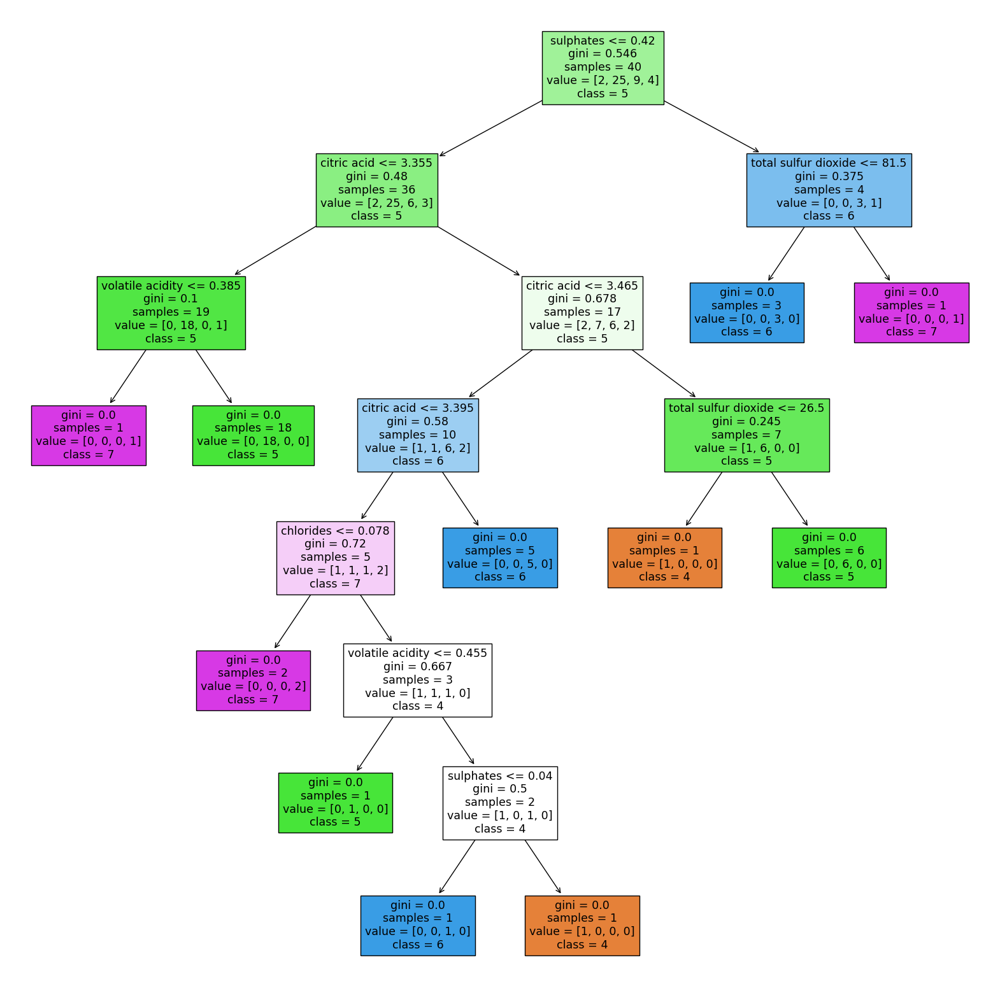

In [45]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True, class_names=[str(i) for i in set(y1)],feature_names=[str(i) for i in set(x1)])

How to restrict the growth of DecisionTree

post pruning

In [46]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5], dtype=int64)

In [48]:
dt_model.score(x1, y1)

0.875

In [47]:
dt_model.score(x_test, y_test)

0.581453634085213

In [50]:
path = dt_model1.cost_complexity_pruning_path(x1,y1)
path

{'ccp_alphas': array([0.        , 0.025     , 0.0375    , 0.04      , 0.04285714,
        0.04736842, 0.055     , 0.09117481]),
 'impurities': array([0.        , 0.05      , 0.0875    , 0.1275    , 0.17035714,
        0.21772556, 0.27272556, 0.54625   ])}

In [51]:
ccp_alpha = path.ccp_alphas
ccp_alpha

array([0.        , 0.025     , 0.0375    , 0.04      , 0.04285714,
       0.04736842, 0.055     , 0.09117481])

In [55]:
dt_model2 = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1, y1)
    dt_model2.append(dt_m)

In [56]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.025),
 DecisionTreeClassifier(ccp_alpha=0.0375),
 DecisionTreeClassifier(ccp_alpha=0.039999999999999994),
 DecisionTreeClassifier(ccp_alpha=0.042857142857142864),
 DecisionTreeClassifier(ccp_alpha=0.0473684210526316),
 DecisionTreeClassifier(ccp_alpha=0.05500000000000002),
 DecisionTreeClassifier(ccp_alpha=0.09117481203007516)]

Text(0, 0.5, 'score')

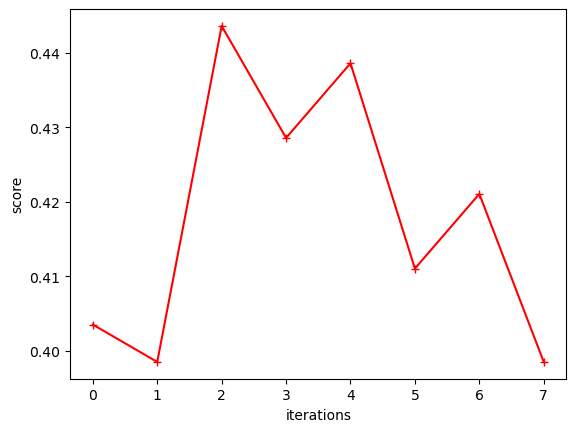

In [57]:
dt_model2 = []
score = []
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=i)
    dt_m.fit(x1, y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test, y_test))
    
    
plt.plot(score, 'r-+')
plt.xlabel('iterations')
plt.ylabel('score')

In [58]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.025),
 DecisionTreeClassifier(ccp_alpha=0.0375),
 DecisionTreeClassifier(ccp_alpha=0.039999999999999994),
 DecisionTreeClassifier(ccp_alpha=0.042857142857142864),
 DecisionTreeClassifier(ccp_alpha=0.0473684210526316),
 DecisionTreeClassifier(ccp_alpha=0.05500000000000002),
 DecisionTreeClassifier(ccp_alpha=0.09117481203007516)]

In [59]:
train_score = [i.score(x1,y1) for i in dt_model2]

In [60]:
test_score = [i.score(x_test,y_test) for i in dt_model2]

In [61]:
train_score

[1.0, 0.95, 0.925, 0.9, 0.875, 0.85, 0.825, 0.625]

In [62]:
test_score

[0.40350877192982454,
 0.39849624060150374,
 0.44360902255639095,
 0.42857142857142855,
 0.43859649122807015,
 0.41102756892230574,
 0.42105263157894735,
 0.39849624060150374]

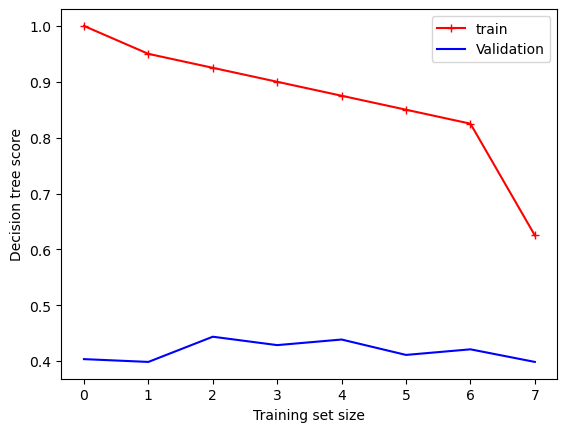

In [63]:
plt.plot(train_score, 'r-+', label= 'train')
plt.plot(test_score, 'b-', label= 'Validation')
plt.xlabel('Training set size')
plt.ylabel('Decision tree score')
plt.legend()

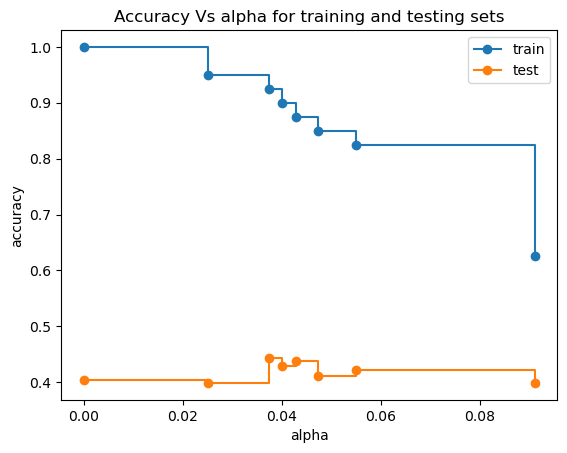

In [64]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy Vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker = "o", label = "train", drawstyle = "steps-post")
ax.plot(ccp_alpha, test_score, marker = "o", label = "test", drawstyle = "steps-post")
ax.legend()
plt.show()

## Author

<a href="https://www.linkedin.com/in/esumit/">Sumit Mitra</a> has a Masters Degree in Electonics Engineering, he is experienced product manager with focused on leveraging machine learning, Artificial Intelligence to Design Thinking and developing new product features and integration. Sumit has been working for Rakuten since 2021.